

<center>

# Trabajo Final: Detección y Segmentación de TN en Imágenes de Ultrasonido

## Procesamiento Avanzado de Imágenes en Biomedicina y Biología

### Segundo Cuatrimestre 2024

<table>
      <tr>
        <th>Alumnos</th>
        <th>Legajos</th>
      </tr>
      <tr>
        <td>
          Bajlec, Ivo<br>
          Grau, Gonzalo Andrés<br>
          Neira, Lucas Matias
        </td>
        <td>
          62175<br>
          62259<br>
          61570<br>
        </td>
      </tr>
    </table>

**Docente**: Roberto Sebastián Tomás

**Fecha de entrega**: 09/12/2024

</center>


# Objetivo del trabajo
El objetivo del presente trabajo es desarrollar algoritmos para identificar y segmentar la translucencia nucal a partir de imágenes de ultrasonido.
Para ello, se aplicarán técnicas avanzadas de reducción de ruido y preprocesamiento, para luego entrenar redes neuronales convolucionales.
Los resultados de este estudio podrían contribuir significativamente al campo de la obstetricia, al proporcionar una herramienta de asistencia a la toma de decisiones, obteniéndose así una estimación de la medida de la TN en forma independiente del operador.

# Introducción
En 1985, se descubrió que existe una correlación entre el grosor del pliegue nucal en fetos del segundo trimestre y las aparación de alteraciones cromosómicas. Luego, se descubrió que este fenómeno también es identificable en el primer trimestre, y se introdujo el término “translucencia nucal” (TN) para describir la región sonoluscente en la parte posterior de la nuca fetal.
Estudios realizados en gestantes de alto riesgo confirmaron esta relación. [4]

Para cuantificar esta relación, se desarrolló un modelo matemático que combinaba el riesgo asociado a la TN con la edad materna y los marcadores bioquímicos: el método de cribado combinado.
Siguiente el protocolo adecuado, descrito por la Fetal Medicine Foundation [3], se toma la medición del máximo ancho de un área anecogénica en la parte dorsal del embrión, a partir de una imagen ampliada que incluya solamente la cabeza y el toráx en una visión sagital.
Una de las principales fuentes de confusión a la hora de tomar estas medidas es identificar como área de la TN al espacio entre la membrana amniótica y la piel fetal, el cual tiene una mofología similar a la del área de interés. 

Un algoritmo especializado para la detección del área de la TN ayudaría al profesional médico a identificar adecuadamente la región de interés (ROI), mientras que una herramienta de segmentación permitiría cuantifica el ancho de la TN en forma objetiva e independiente del operador.
En el siguiente trabajo, se desarrollarán herramientas basadas en redes neuronales convolucionales (CNN) para resolver ambos desafíos.
Para la detección, se aplicará un reajuste de pesos sobre una arquitectura VGG16, entrenándola para obtener bounding boxes que encierren a la ROI mediante regresión.
Luego, para la segmentación, se aplicará una segmentación mediante métodos clásicos a partir de las bounding boxes preexistentes en el dataset, para obtener así una máscara con el segmento de interés para cada imagen.
Utilizando estas segmentaciones, se entrenará un modelo U-NET para obtener las máscaras deseadas. 
En todo momento, se hará uso de imágenes preprocesadas y rescaladas mediante reducción de ruido basado en análisis espectral y aumento sectorial del contraste. 
Finalmente, se evaluarán los resultados obtenidos mediante métricas de precisión.

## Base de datos
Para realizar nuestro trabajo, adquirimos las imágenes necesarias disponibles en [1]. 
Esta base de datos contiene 1528 imágenes de ultrasonido en vista sagital 2D, recolectadas del Shenzhen People's Hospital de 1519 gestantes.
Ademas, se cuenta con una tabla que indica una serie de bounding boxes para distintas estructuras identificables en cada una de las imágenes (entre ellas, la propia TN).
De las 1528, se tomaron solo aquellas identificadas como "Standard", y se filtraron los ejemplos en las que nos se contaba con una bounding box predefinida para la TN.
De esta manera, trabajaremos con 1100 imágenes de scan fetal abdominal y visión sagital del feto, en conjunto con sus correspondientes bounding boxes.

# Materiales y métodos

Para el desarrollo de este trabajo, se hará uso de los siguientes módulos de código abierto:
- numpy
- pandas
- scipy
- matplotlib
- openCV (cv2)
- scikit-image (skimage)
- scikit-learn (sklearn)
- tensorflow
- keras

Además, se desarrolló un módulo propio de denoising de imágenes, disponible en el archivo `denoising4GP.py`. Utilizando estas herramientas, se aplicaron las siguientes técnicas:
- Reescalado por interpolación
- Estimación del ruido mediante el espectro de frecuencia bidimensional
- Ecualización sectorizada del histograma mediante CLAHE

### Pipelines de preprocesamiento 
Para cado uno de los casos presentado a continuación, el preprocesamiento aplicado consiste de los siguientes pasos:
1. Lectura de la imagen desde un archivo .png
2. Lectura de la bounding box correspondiente para la imagen
3. Reducción de ruido basada en el análisis espectral
4. Aumento de contraste mediante CLAHE 

Debido a que el dataset original no contaba con máscaras de segmentación semántica para el área anecogénica de la translucencia nucal, las cuales son de vital importancia para entrenar una red neuronal en esta tarea, se tuvo que desarrollar un algoritmo para segmentar dicha superficie a partir de la ROI de la bounding box. El pipeline adoptado consiste en:
1. Aplicar un filtro pasa altos para resaltar los bordes
2. Binarizar la imagen filtrada por Otsu
3. Utilizar morfología matemática para mejorar la binarización
3. Etiquetar las áreas cerradas internas a la bounding box en la binarización
4. Seleccionar la etiqueta correspondiente al área más grande
5. Calcular el centroide de dicho segmento
6. Partiendo del centroide, aplicar el método de region growing sobre la imagen original

Finalmente, se entrenaron dos modelos de redes neuronales: un modelo basado en fine-tuning de VGG16 cuya salida es una regresión de las bounding boxes, y otro modelo basado en la U-NET cuya salida es una segmentación del área de la TN.



---

# I. IDENTIFICACIÓN DE TRANSLUCENCIA NUCAL

El objetivo de esta primera parte del Trabajo es lograr entrenar una red neuronal que sea capaz de identificar de la manera más precisa posible la localización de la Translucencia Nucal (TN). Para ello, se utilizarán las coordenadas de los _bounding boxes_ asociados a los TNs de distintas imágenes. La información de los _bounding boxes_ fue aportada por el dataset.

In [1]:
# Librerías

import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import cv2

from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Reshape, Dropout, BatchNormalization
from keras.regularizers import l2,l1,L1L2
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from keras.metrics import Precision, SensitivityAtSpecificity, Accuracy
from keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast, RandomTranslation
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import MeanSquaredError

from sklearn.model_selection import train_test_split
import random

## Lectura de información

In [2]:
path = "/kaggle/input/lmn-fetus-tn/dataset"

dir_list = os.listdir(path)
print("Files and directories in '", path, "' :")
# prints all files
print(dir_list)

Files and directories in ' /kaggle/input/lmn-fetus-tn/dataset ' :
['ObjectDetection.xlsx', 'Set1-TrainingValidation Sets CNN', 'External Test Set', 'Internal Test Set', 'Set2-TrainingValidation Sets ANN Scoring system', 'ObjectDetection.csv']


## Funciones para preprocesamiento de las imágenes

Las funciones a continuación tienen el objetivo de eliminar gran cantidad del ruido de una imagen optenida por Ecografía, es decir, llevar a cabo el denoising de la imagen. El algoritmo funciona a través del uso de la Transformada de Fourier de la imagen original, calculando luego su magnitud espectral (MS). La MS de la imagen es utilizada como base para generar máscaras que ocultan el ruido de la señal. El cálculo de esta máscara se basa en la selección de dos umbrales para los valores de la MS: un umbral inferior y un umbral superior. El cálculo automático de estos umbrales está dado por las siguientes ecuaciones:

- Umbral inferior: mean(MS) + alpha*std(MS)
- Umbral superior: max(MS) - beta*std(MS)

Siendo, 'mean' el valor medio de la magnitud espectral, 'std' el desvío estándar de la magnitud espectral, 'alpha' y 'beta' parámetros ajustables, inicialmente de valor 0.5 y 'max' el valor máximo de la magnitud espectral.

La función *lukinoising* lleva a cabo el denoising.

In [3]:
metadata_path = '/ObjectDetection.xlsx'
df_metadata = pd.read_excel(path + metadata_path)

# Convert h_min, w_min, h_max, w_max to integers
for col in ['h_min', 'w_min', 'h_max', 'w_max']:
    df_metadata[col] = df_metadata[col].astype(int)

display(df_metadata)

,fname,structure,h_min,w_min,h_max,w_max
0,168.png,thalami,178,171,244,261
1,168.png,nasal bone,96,308,111,349
2,168.png,palate,133,300,205,408
3,168.png,nasal skin,86,324,95,349
4,168.png,nasal tip,79,345,89,376
...,...,...,...,...,...,...
9428,1577.png,nasal tip,134,363,142,385
9429,1577.png,NT,354,240,374,392
9430,1577.png,palate,169,317,219,407
9431,1577.png,thalami,192,217,244,281


### Obtención de aquellas imágenes que posean TN

In [4]:
# Keep only the rows where structure is NT

df_nt = df_metadata[df_metadata['structure'] == 'NT']
df_nt = df_nt.drop(columns=['structure'])
display(df_nt)

,fname,h_min,w_min,h_max,w_max
6,168.png,385,257,418,464
16,169.png,372,126,428,371
20,170.png,376,12,416,478
30,171.png,359,173,389,529
37,172.png,375,293,399,380
...,...,...,...,...,...
9394,661.png,432,274,454,414
9403,90.png,366,14,413,295
9411,1006.png,380,274,422,635
9420,1007.png,363,189,426,581


# Funciones para preprocesamiento de las imágenes

In [5]:
def calculate2DFT(img):
    #Cálculo de la FFT
    fft_img = np.fft.ifftshift(img)
    fft_img = np.fft.fft2(fft_img)
    fft_img = np.fft.fftshift(fft_img)
    return fft_img

def calculateMagnitudSpectrum(img):
    #FFT
    img_fft = calculate2DFT(img)
    #Magnitud Spectrum
    img_ms = 20*np.log10(np.abs(img_fft))
    return img_ms

def calculate2DInverseFT(img_fft):
    # Cálculo de la IFFT
    ift = np.fft.ifftshift(img_fft)
    ift = np.fft.ifft2(ift)
    ift = np.fft.fftshift(ift)
    ift = ift.real
    return ift

# Funciones para crear máscaras

def cr8MaskForNoise(img,thresh_list=None):
    img_ms = calculateMagnitudSpectrum(img)
    
    if thresh_list == None:
        thresh_min = np.min(img_ms)
        thresh_max = np.max(img_ms)
    else:
        thresh_min = thresh_list[0]
        thresh_max = thresh_list[1]
    
    mask = img_ms
    mask[mask<thresh_min] = 1.0
    mask[mask>thresh_max] = 1.0
    mask[mask != 1.0] = 0.0
    
    return mask

def cr8MaskForSignal(img,thresh_list=None):
    img_ms = calculateMagnitudSpectrum(img)
    
    if thresh_list == None:
        thresh_min = np.min(img_ms)
        thresh_max = np.max(img_ms)
    else:
        thresh_min = thresh_list[0]
        thresh_max = thresh_list[1]
    
    mask = img_ms
    mask[mask<thresh_min] = 0.0
    mask[mask>thresh_max] = 0.0
    mask[mask != 0.0] = 1.0
    
    return mask

# Función para denoising

def denoisingFFT(img,ths_list,mode='1'):
    
    if mode == '0':
    
        mask = cr8MaskForNoise(img,ths_list)
    
        img_fft = calculate2DFT(img)
        
        noise = calculate2DInverseFT(img_fft*mask)
        
        dummy0 = img - noise

        dummy1 = dummy0

        dummy1[dummy1 < 0] = 0

        dummy2 = np.uint8(dummy1)
        
        return dummy2
    
    elif mode == '1':
        mask = cr8MaskForSignal(img,ths_list)
        
        img_fft = calculate2DFT(img)
        
        signal = calculate2DInverseFT(img_fft*mask)
        
        signal[signal < 0] = 0
        
        signal = np.uint8(signal)
        
        return signal

# Función principal

def lukinoising(img,alpha=0.5,beta=0.5):
    
    equ = cv2.equalizeHist(img)

    img_ms = calculateMagnitudSpectrum(equ)

    umbral_inferior = np.uint16(np.mean(img_ms)+alpha*np.std(img_ms))
    umbral_superior = np.uint16(np.max(img_ms)-beta*np.std(img_ms))

    new_img = denoisingFFT(equ,[umbral_inferior,umbral_superior],mode='1')

    return new_img


## I.1.1. Preprocesamiento de datos: imágenes para entrenamiento

Tanto las imágenes para entrenamiento como los coordenadas de los _bounding boxes_ deben ser preprocesados para que la red pueda aprender adecuadamente.

En primer lugar, el tamaño del set de imágenes a utilizar para el entrenamiento tendrá un tamaño de 1110 imágenes. A cada imágenes se le aplicará el algoritmo de denoising `lukinoising` que consiste en un filtrado de gran parte del ruido de las imágenes original a través de transformada de Fourier. Una vez aplicado el algoritmo de denoising, las imágenes resultantes pierden el rango de gamas de grises originales, por lo que ciertas estructuras pueden desaparecer. Por esta razón, a la imagen resultante del denoising se le suma la mitad de los valores de la imagen original, esto es con la intención de conservar detalles más finos que solo son posibles de observar con una escala de grises más amplia.

In [ ]:
# Gather the images paths

list_paths = [path+'/External Test Set/Standard',path+'/Internal Test Set/Standard',path+'/Set1-TrainingValidation Sets CNN/Standard',path+'/Set2-TrainingValidation Sets ANN Scoring system/Standard']

valid_ids = df_nt['fname'].unique()
resize_dim = (300, 225)
images = []
image_ids = []
bounding_boxes = []

for dir in list_paths:

    for i, fname in enumerate(os.listdir(dir)):
        if not fname.endswith('.png') or fname not in valid_ids:
            continue
        
        image_ids.append(fname)
        img_raw = cv2.imread(os.path.join(dir, fname), cv2.IMREAD_GRAYSCALE)
    
        # Resize image
        img = cv2.resize(img_raw, resize_dim)

        noise = img.copy()
        
        # Denoising
        img = lukinoising(img,alpha=-1,beta=0.5)

        # Aumento del nivel de grises
                
        img = img + 0.5*noise

        img[img>255] = 255

        img = np.uint8(img)
        
        # Convert to RGB for VGC16
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        images.append(img)
        
        # Get the bounding box coordinates
        h_min = df_nt[df_nt['fname'] == fname]['h_min'].values[0]
        h_max = df_nt[df_nt['fname'] == fname]['h_max'].values[0]
        w_min = df_nt[df_nt['fname'] == fname]['w_min'].values[0]
        w_max = df_nt[df_nt['fname'] == fname]['w_max'].values[0]
        
        # Resize the bounding box
        h_min = int(h_min * img.shape[0] / img_raw.shape[0])
        h_max = int(h_max * img.shape[0] / img_raw.shape[0])
        w_min = int(w_min * img.shape[1] / img_raw.shape[1])
        w_max = int(w_max * img.shape[1] / img_raw.shape[1])
        
        bounding_boxes.append(np.array([h_min, w_min, h_max, w_max]))
        

images = np.array(images)
bounding_boxes = np.array(bounding_boxes)

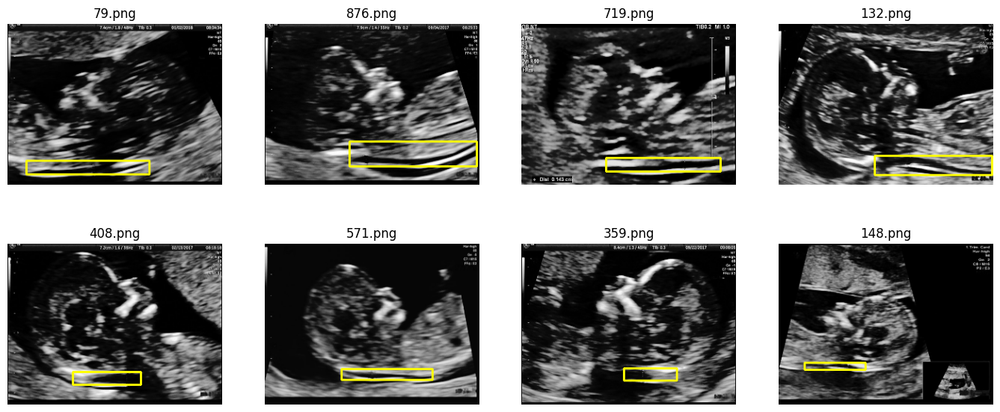

In [7]:
random_indexes = random.sample(range(len(images)),8)

fig = plt.figure(figsize=(17,7))

for i,index in enumerate(random_indexes):

    w_min = bounding_boxes[index][1]
    h_min = bounding_boxes[index][0]
    w_max = bounding_boxes[index][3]
    h_max = bounding_boxes[index][2]
    
    img_rect = cv2.rectangle(images[index].copy(), (w_min, h_min), (w_max, h_max), (255, 255, 0), 2)
    
    ax = fig.add_subplot(2,4,i+1)
    ax.imshow(img_rect)
    ax.set_title(image_ids[index])
    ax.axis('off')
    


In [8]:
print('Cantidad de imágenes: ',np.shape(images))
print('Cantidad de bounding boxes: ',np.shape(bounding_boxes))

Cantidad de imágenes:  (1110, 225, 300, 3)
Cantidad de bounding boxes:  (1110, 4)


## I.1.2. Preprocesamiento de datos: normalización de imágenes y _bounding boxes_

Tanto las imágenes como las _bounding boxes_ son normalizadas para que el entrenamiento de la red aprenda adecuadamente los parámentros, y, a su vez, se reduzcan los tiempos de entrenamiento.

In [9]:
images_normalized = images / 255.0
bounding_boxes_normalized = bounding_boxes / np.array(images_normalized.shape[1:3] * 2)

## I.2. Split de datos para entrenamiento

Los datos son divididos de manera aleatoria en set de _training_ y _validation_. Las prorporciones son: 80-20.

train_x:  (888, 225, 300, 3)
train_y:  (888, 4)
val_x:  (222, 225, 300, 3)
val_y:  (222, 4)


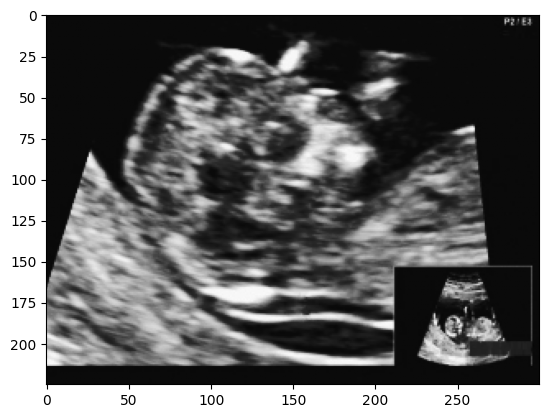

[0.75111111 0.36333333 0.83111111 0.70333333]


In [10]:
# Split the dataset
train_x, val_x, train_y, val_y = train_test_split(images_normalized, bounding_boxes_normalized, test_size=0.2)

# Dimensiones
print('train_x: ', np.shape(train_x))
print('train_y: ', np.shape(train_y))
print('val_x: ', np.shape(val_x))
print('val_y: ', np.shape(val_y))

# Corroboración - imágenes
plt.imshow(train_x[0], cmap='gray')
plt.show()

# Corroboración - bounding boxes
print(train_y[0])

## I.3.1. Definición del modelo

La red neuronal tendrá la tarea de aprender a asociar las estructuras en las imágenes correspondientes a TNs junto a su etiqueta que serán las coordeandas de los _bounding_boxes_, por lo tanto, la red entregará como resultado las coordenadas de lo que considere que son los límites de la translucencia nucal.

El modelo a entrenar utilizará de base el modelo VGG16 junto a los pesos asociados de 'Imagenet'. De esta modelo de base, se configurará para que todas sus capas puedan ser entrenables. Luego del modelo base, se utilizará una serie de tres capas profundas y densas, intercaladas con operaciones de Dropout. La capa de output consitirá en una capa de cuatro neuronas, las cuales entregarán las coordenadas de las _bounding_boxes_ predichas por el modelo.

In [11]:
# Define the model
def create_model(input_shape):
    vgg16 = VGG16(include_top=False, input_shape=input_shape)
    vgg16.trainable = True
    
    model = Sequential()
    model.add(vgg16)
    model.add(Flatten())
    model.add(Dropout(0.1))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.05))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(4, activation='sigmoid'))
    
    return model

model = create_model(images[0].shape)

model.summary()    

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ ?                      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

## I.3.2. Entrenamiento del modelo

- Métricas: se utilizará la métrica Mean Squared Error, debido a que la red debe devolver números (regresión) lo más parecidos posibles a aquuellos asociados a la etiqueta de las imágenes.

- Optimizador: Adam
- Learning Rate inicial: 1e-4
- Batchsize: 16
- Epochs: 50
- Callbacks: ReduceLROnPlateu y EarlyStopping

    Se optó un por _batchsize_ de poca magnitud por dos razones: por un lado, para garanzitar que la red adquiera un conocimiento más profundo de las estructuras de las imágenes; por otro lado, el dataset cuenta con un tamaño reducido, por lo que colocar tamañas de _batchsize_ mayores podrá perjudicar el entrenamiento del modelo.

In [12]:
# Train the model
lr = 1e-4
checkpoint = ModelCheckpoint('model2.weights.h5', monitor='val_loss', save_best_only=True, save_weights_only=True)
rlrop = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=7, verbose=1)

model.compile(optimizer=Adam(learning_rate=lr), loss=MeanSquaredError(), metrics=[MeanSquaredError()])
history = model.fit(train_x, train_y, validation_data=(val_x, val_y), batch_size=16, epochs=50, callbacks=[checkpoint,rlrop,early_stopping])

Epoch 1/50


I0000 00:00:1733610437.420166     100 service.cc:145] XLA service 0x7f0560014680 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733610437.420255     100 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733610437.420262     100 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1733610478.367975     100 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


56/56 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0041 - val_mean_squared_error: 0.0041 - learning_rate: 1.0000e-04
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 21s 369ms/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0036 - val_mean_squared_error: 0.0036 - learning_rate: 1.0000e-04
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 21s 378ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0093 - val_mean_squared_error: 0.0093 - learning_rate: 1.0000e-04
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 23s 412ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0030 - val_mean_squared_error: 0.0030 - learning_rate: 1.0000e-04
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 22s 393ms/step - loss: 0.0034 - mean_squared_error: 0.0033 - val_loss: 0.0029 - val_mean_squared_error: 0.0029 - learning_rate: 1.0000e-04
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 21s 372ms/step - loss: 0.0034 - mean_squared_error: 0.0034 - val_loss: 0.0034 - val_mean_s

In [13]:
model.save('lukimodel.h5')

## I.4.1. Resultados: visualización de la métrica MSE

El entrenamiento del modelo arroja los siguientes resultados:

- MSE training: 7.9338e-4
- MSE validation: 0.0021

Esta métrica indica que la red ha logrado comprender con bastante precisión la ubicación de las _bounding boxes_ de las TNs. Es importante recalcar que, tanto el MSE del training como del validation son similares entre sí, por lo que es posible afirmar que la regularización propuesta en el modelo dió buenos resultados.

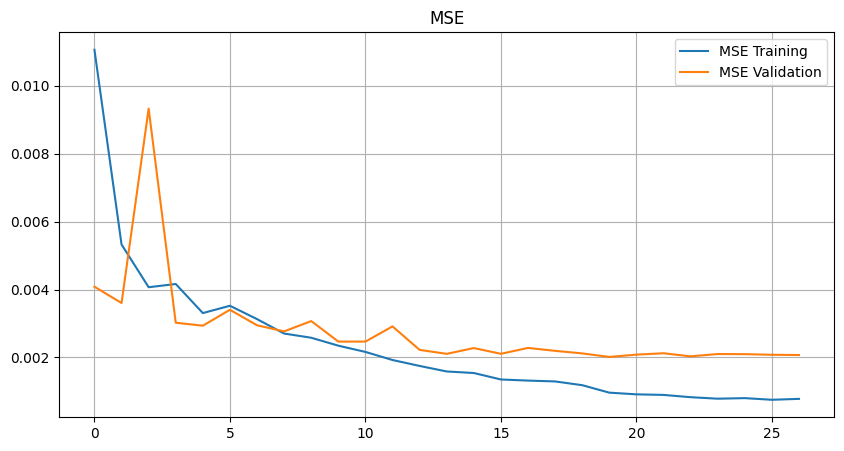

In [14]:
fig = plt.figure(figsize=(10,5))

ax = fig.add_subplot(1,1,1)
ax.plot(history.history['mean_squared_error'],label='MSE Training')
ax.plot(history.history['val_mean_squared_error'],label='MSE Validation')
ax.set_title('MSE')
ax.legend()
ax.grid()
plt.show()

## I.4.2. Resultados: comparación visual de _bounding boxes_

La intención a continuación es visualizar efectivamente si la red ha podido predecir _bounding boxes_ coherentes.

In [15]:
def compare_segmentations(model: Model, img: np.ndarray, bounding_box: np.ndarray) -> float:
    """
    Side by side plot comparing original bounding box and the predicted one,
    by resizing the model output to original image size and superimposing
    :param model: regression model
    :param img: original image 
    :param bounding_box: origina bounding box
    :return: mean squared error 
    """
    bounding_box = bounding_box.copy()
    img = img.copy()

    rescaling_arr = np.array(img.shape[:2] * 2)
    
    pred = model.predict(np.array([img]))[0]
    pred *= rescaling_arr
    bounding_box *= rescaling_arr

    mse = np.mean((bounding_box - pred) ** 2)

    bounding_box = np.int32(bounding_box)
    pred = np.int32(pred)

    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    img_with_bb = cv2.rectangle(img.copy(), (int(bounding_box[1]), int(bounding_box[0])), (int(bounding_box[3]), int(bounding_box[2])), (255, 255, 0), 2)
    img_with_pred_bb = cv2.rectangle(img.copy(), (int(pred[1]), int(pred[0])), (int(pred[3]), int(pred[2])), (0, 255, 0), 2)
    axs[0].imshow(img_with_bb)
    axs[0].axis('off')
    axs[0].set_title('Original bounding box')
    axs[1].imshow(img_with_pred_bb)
    axs[1].axis('off')
    axs[1].set_title('Predicted bounding box')
    plt.show()
    
    return mse

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


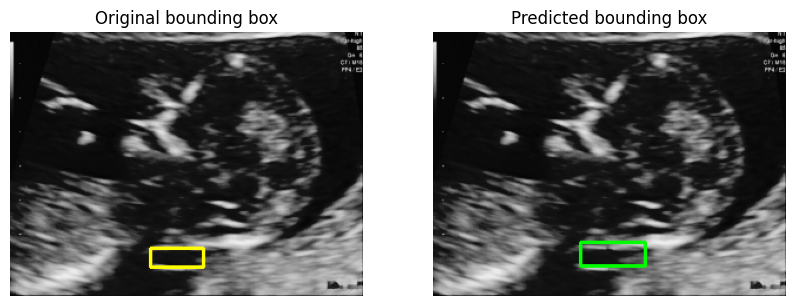

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


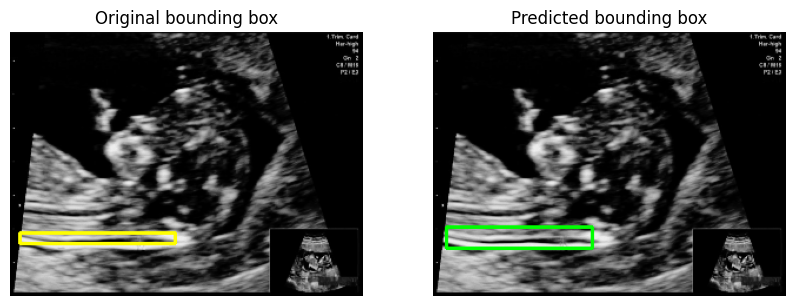

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


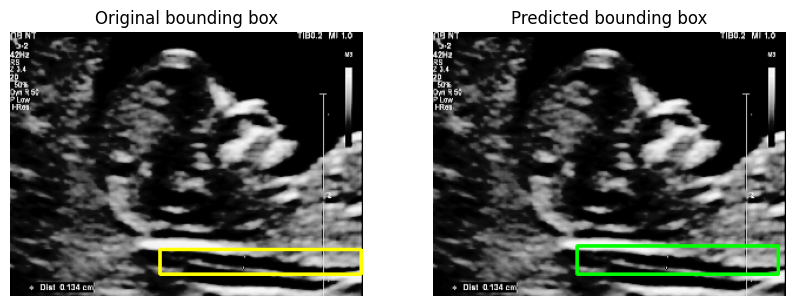

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


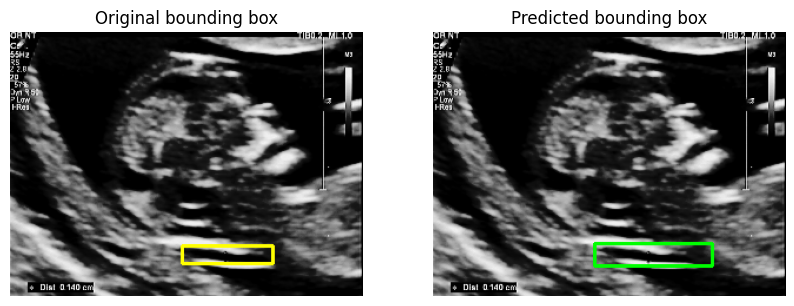

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


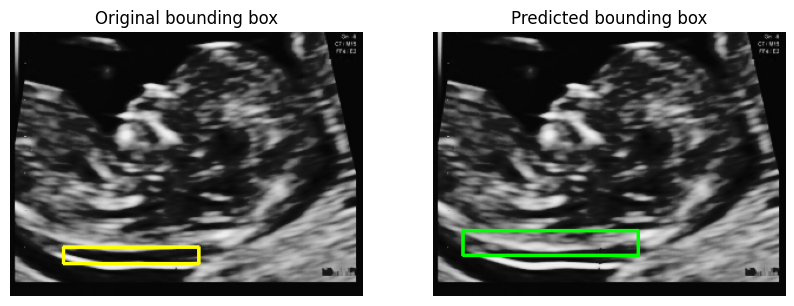

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


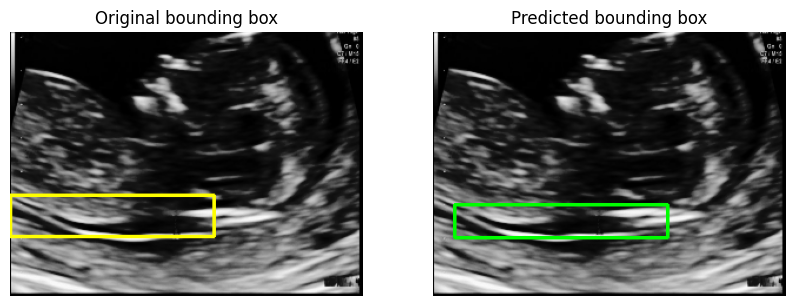

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


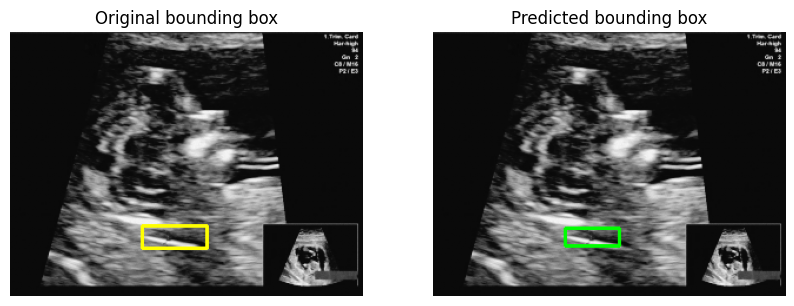

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


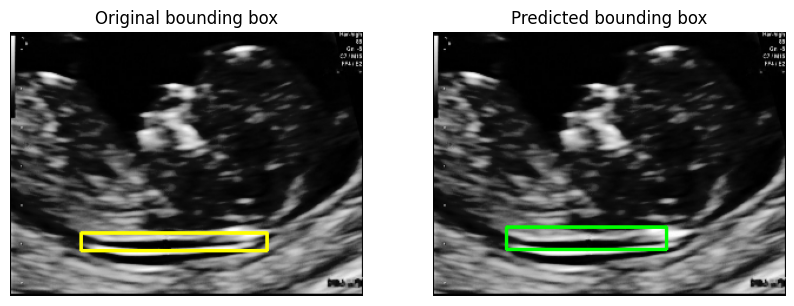

In [17]:
random_indexes_val = random.sample(range(len(val_x)),8)

# Compare segmentation
for index in random_indexes_val:
    compare_segmentations(model, val_x[index], val_y[index])

## I.5. Conclusiones del entrenamiento para identificación

A partir de la visualización de la ubicación de los _bounding boxes_ predichos por la red es posible afimar que la red ha adquirido la capacidad de ubicar adecuadamente la ubicación espacial de las TNs. Si bien los límites de las TNs no siempre se corresponden con los valores verdaderos, es importante mencionar que en todas las predicciones siempre gran parte de la TNs queda encerrada por los _bounding boxes_ predichos por la red.

Celebramos esta capacidad de la red para aprender a identificar con una buena aproximación inicial la ubicación de las TNs. Por otro lado, consideramos como trabajo a futuro la posibilidad de entrenar la red con otra arquitectura de capas densas y/o hiperparámetros que permitan obtener valores de MSE aún más bajos en la etapa de validation.

---

# II. SEGMENTACIÓN DE TRANSLUCENCIA NUCAL

El objetivo de esta segunda parte del trabajo es lograr entrenar una red neuronal que sea capaz de segmentar de la manera más precisa posible el area anecogénica de la Translucencia Nucal (TN). 
Para ello, se utilizarán las segmentaciones hechas a partir de las bounding boxes del training set original. Este procese se encuentra deetallado en el notebook de anexo `segmentation_from_bb.ipynb`.
A partir de ello, se entrenó un modelo de segmentación semántica basado en la arquitectura U-NET

U-net for the segmentation of NT 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Rescaling
from tensorflow.image import resize
import os 
import cv2

## II.1. Segmentación basada en bounding boxes
### Generación de máscaras binarias para el training set

Como se indicó anteriormente, la segmentación propiamente dicha de las imágenes del training set se realizó a partir de las bounding boxes originales. El dataset original no contaba con segmentaciones binarias, por lo que se tuvo que diseñar un proceso para extraerlas. La segmentación se realizó de la siguiente manera:

1. Aplicar el denoising anteriormente explicado
2. Aumentar el constraste con CLAHE
3. Aplicar un filtro pasa altos
4. Binarizar la sección de interés de la imagen (interna a la bounding box conocida) por Otsu
5. Mejorar la binarización por apertura y cierre
5. Aplicar etiquetado sobre las secciones encontradas
6. Seleccionar la etiqueta que corresponde a la TN como aquella con mayor área
7. Tomar el centroide de esta etiqueta 
8. Aplicar region growing a la imagen original partiendo de dicho punto
9. Si el área de la segmentación es muy pequeña, mover la semilla aleatoriamente y repetir el region growing



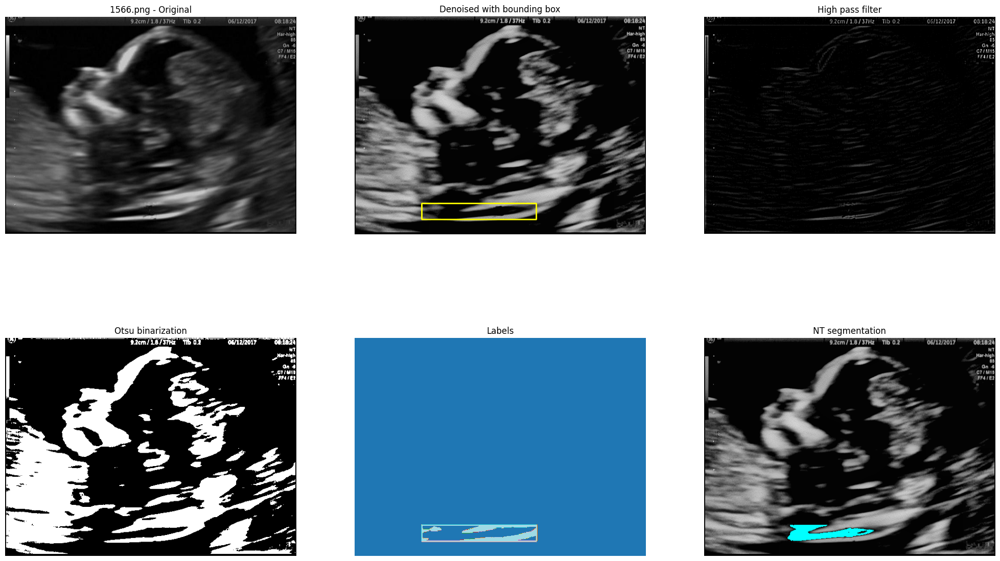

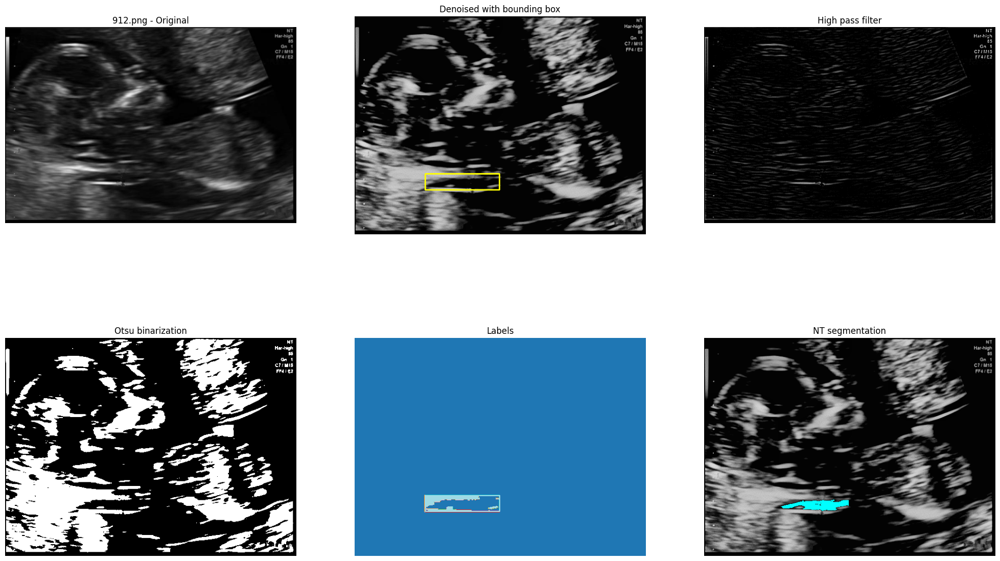

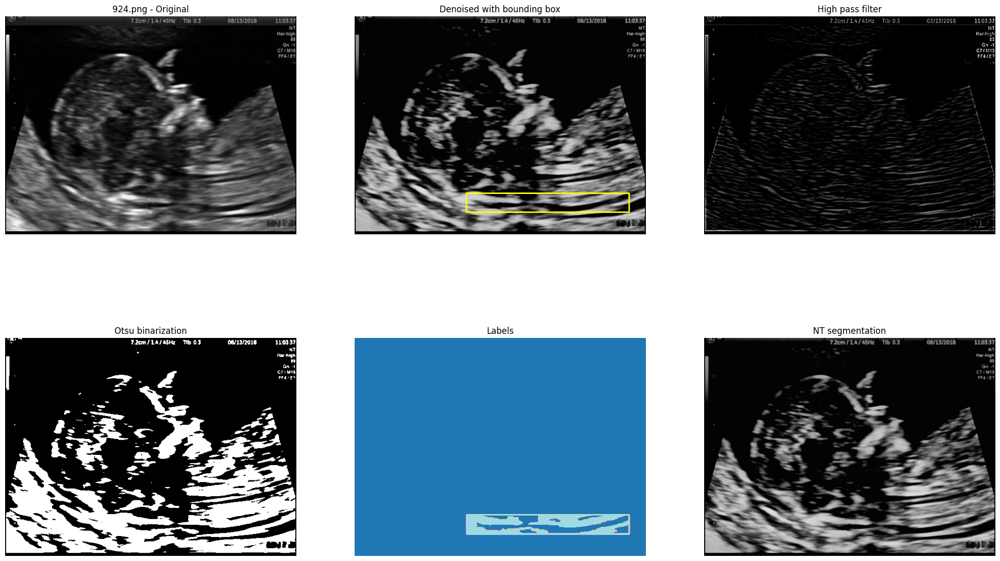

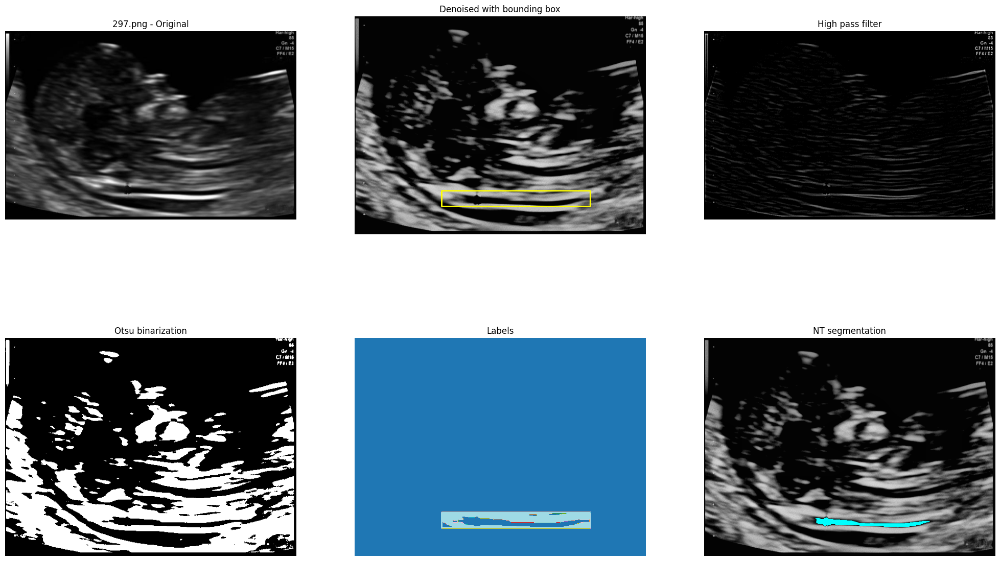

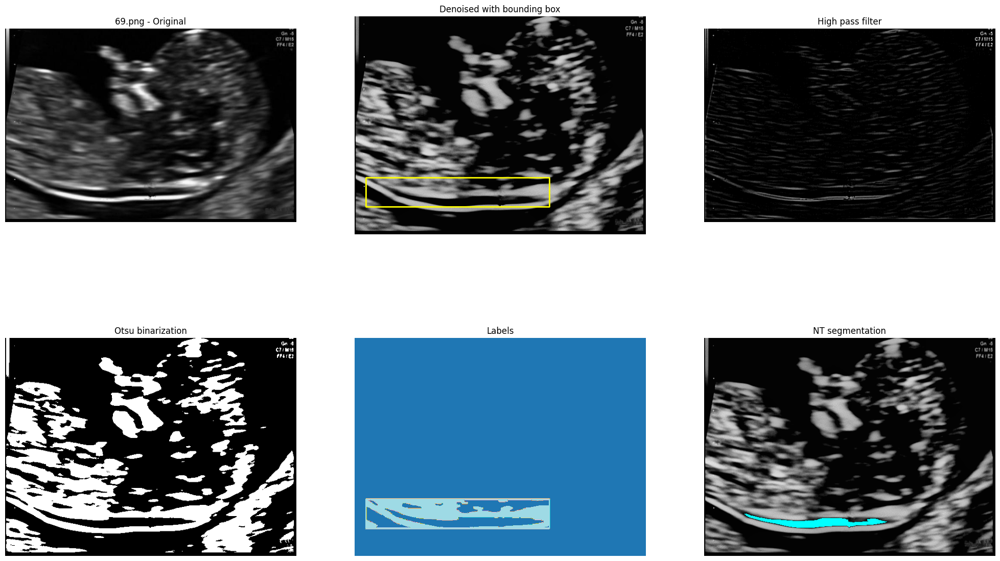

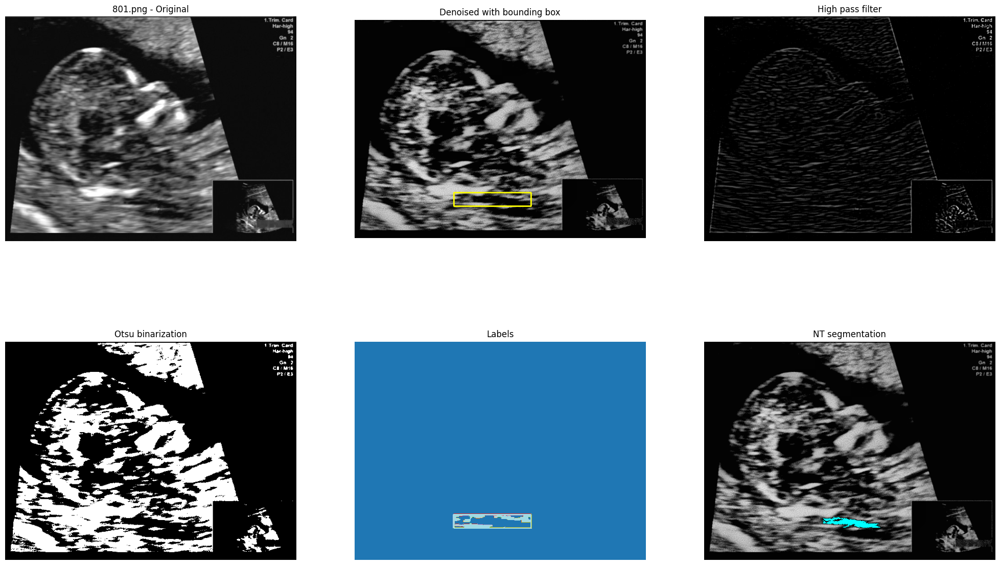

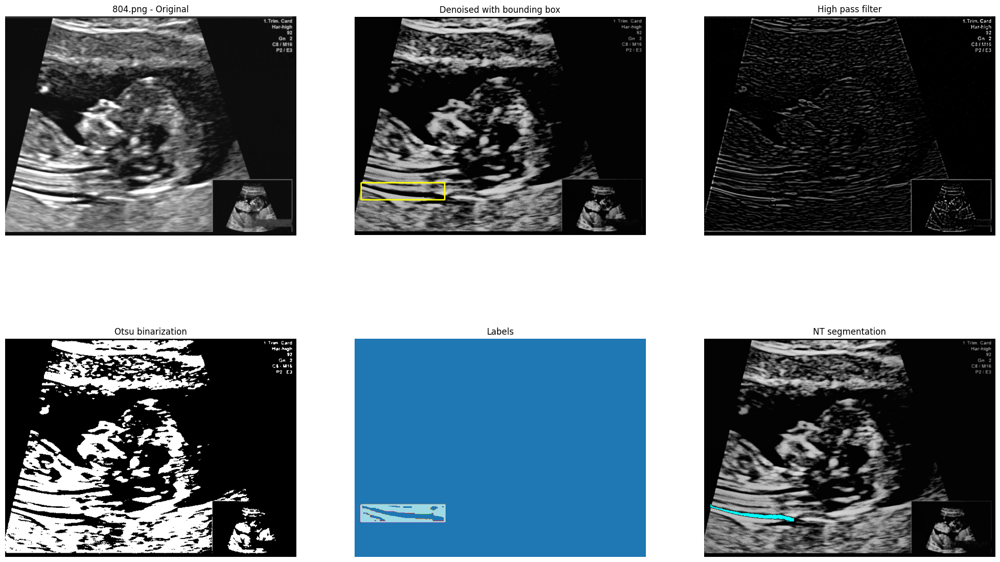

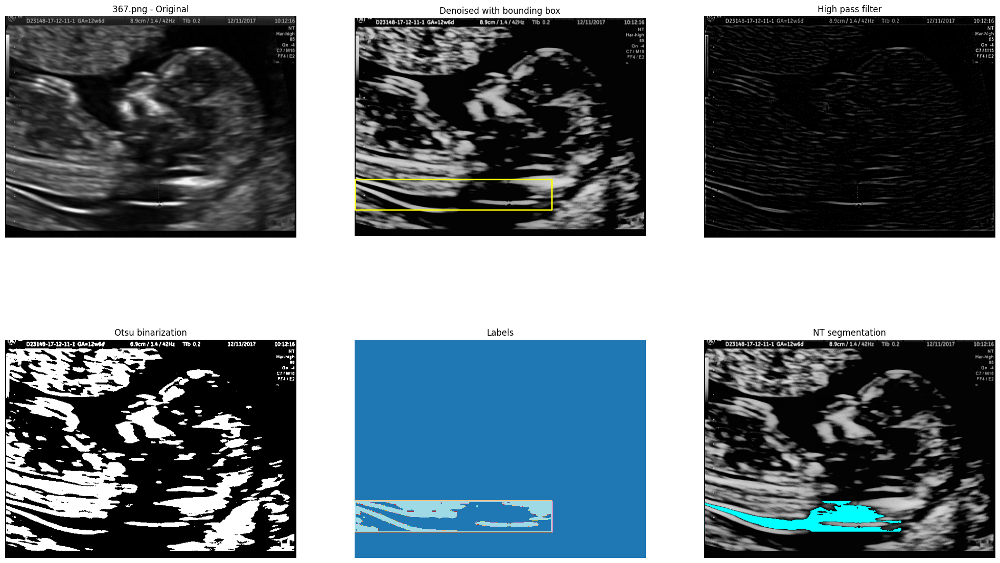

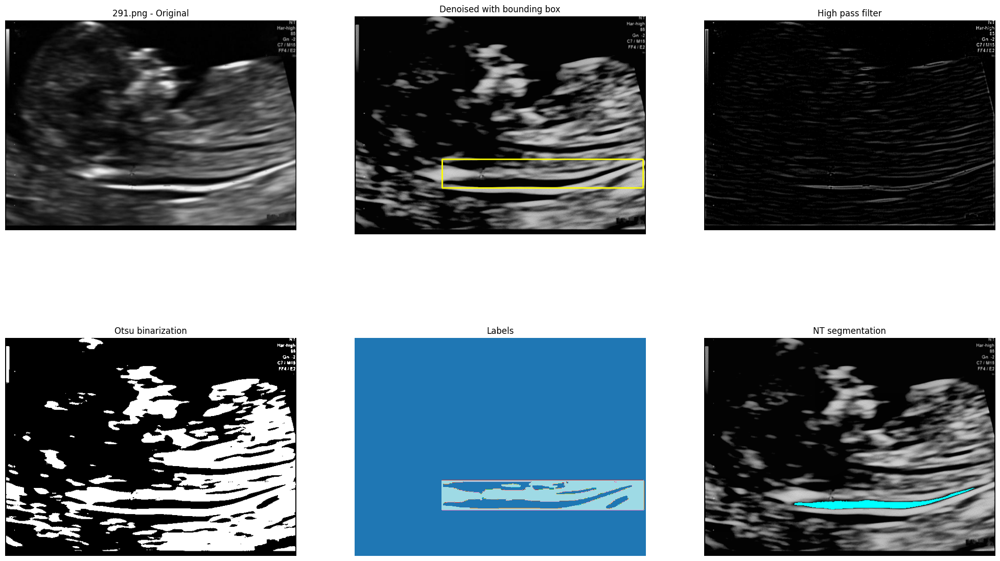

In [ ]:
# Gather the images paths
valid_ids = df_nt['fname'].unique()
resize_dim = (600, 450)
images = []
segmentations = []
image_ids = []
bounding_boxes = []

for dataset_standard_path in standard_dirs:
    for i, fname in enumerate(os.listdir(dataset_standard_path)):
        # Skip invalid files
        if not fname.endswith('.png') or fname not in valid_ids:
            continue

        image_ids.append(fname)
        img_raw = cv2.imread(os.path.join(dataset_standard_path, fname), cv2.IMREAD_GRAYSCALE)

        # Resize image
        img = cv2.resize(img_raw, resize_dim)

        # Denoising
        img = lukinoising(img)

        # Equalize histogram to improve contrast using CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        img = clahe.apply(img)

        # Convert to color image
        img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

        # Get the bounding box coordinates
        h_min = df_nt[df_nt['fname'] == fname]['h_min'].values[0]
        h_max = df_nt[df_nt['fname'] == fname]['h_max'].values[0]
        w_min = df_nt[df_nt['fname'] == fname]['w_min'].values[0]
        w_max = df_nt[df_nt['fname'] == fname]['w_max'].values[0]

        # Resize the bounding box
        h_min = int(h_min * img.shape[0] / img_raw.shape[0])
        h_max = int(h_max * img.shape[0] / img_raw.shape[0])
        w_min = int(w_min * img.shape[1] / img_raw.shape[1])
        w_max = int(w_max * img.shape[1] / img_raw.shape[1])

        bounding_boxes.append(np.array([h_min, w_min, h_max, w_max]))

        ##############################
        # NT segmentation
        ##############################
        img_saved = img.copy()

        # Apply high pass filter to the image
        img = cv2.GaussianBlur(img_raw, (5, 5), 0)
        img = cv2.subtract(img, cv2.GaussianBlur(img, (5, 5), 0))
        img_hp = img.copy()

        # Binarize using otsu
        _, img = cv2.threshold(img_saved, 0, 255, cv2.THRESH_OTSU)
        img_otsu = img.copy()

        # Use mathematical morphology to remove small objects, and smooth
        kernel = np.ones((3, 3), np.uint8)
        img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
        img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
        img_open_close = img.copy()

        # Apply labeling segmentation
        img_inside_bb = img[h_min:h_max, w_min:w_max]
        labels = label(img_inside_bb, connectivity=1)

        # The most common label contains the NT
        nt_label = labels == 0

        # Pick the centroid of this label as the seed for a flood fill applied to the otsu binarized image
        # NOTE: The flood is applied to the otsu binarized image without high pass filtering
        img_roi = img_saved[h_min:h_max, w_min:w_max]
        nt_points = np.argwhere(nt_label)
        centroid = nt_points.mean(axis=0).astype(int)
        x_seed, y_seed = centroid
        nt_segmentation = skimage.segmentation.flood(img_roi, (x_seed, y_seed), tolerance=1)

        # Sometimes, the segmentation is too small, so we randomly move the seed point and try again
        n_iter = 0
        max_iter = 50
        roi_area = img_roi.shape[0] * img_roi.shape[1]
        while nt_segmentation.sum() < 0.1*roi_area and n_iter < max_iter:
            n_iter += 1
            x_seed = np.random.randint(img_roi.shape[0])
            y_seed = np.random.randint(img_roi.shape[1])
            nt_segmentation = skimage.segmentation.flood(img_roi, (x_seed, y_seed), tolerance=1)

            
        # Draw the segmentation as a binary image of the same shape as the original
        segmentation = np.zeros_like(img)
        segmentation[h_min:h_max, w_min:w_max] = nt_segmentation * 255

        # Draw one of every 100 images
        if not i % 150:
            fig, axs = plt.subplots(2, 3, figsize=(25, 15))
            axs = axs.ravel()
            img_rect = cv2.rectangle(img_color.copy(), (w_min, h_min), (w_max, h_max), (255, 255, 0), 2)

            axs[0].imshow(img_raw, cmap='gray')
            axs[0].axis('off')
            axs[0].set_title(f"{fname} - Original")

            axs[1].imshow(img_rect, cmap='gray')
            axs[1].axis('off')
            axs[1].set_title("Denoised with bounding box")
            
            axs[2].imshow(clahe.apply(img_hp), cmap='gray')
            axs[2].axis('off')
            axs[2].set_title("High pass filter")
            
            axs[3].imshow(img_otsu, cmap='gray')
            axs[3].axis('off')
            axs[3].set_title("Otsu binarization")
            
            null_image = np.zeros_like(img)
            null_image[h_min:h_max, w_min:w_max] = labels*255
            null_image = cv2.rectangle(null_image.copy(), (w_min, h_min), (w_max, h_max), (255, 255, 0), 2)
            axs[4].imshow(null_image, cmap='tab20')
            axs[4].axis('off')
            axs[4].set_title("Labels")
            
            img_w_seg = img_color.copy()
            img_w_seg[h_min:h_max, w_min:w_max, :][nt_segmentation] = [0, 255, 255]
            axs[5].imshow(img_w_seg, cmap='gray')
            axs[5].axis('off')
            axs[5].set_title("NT segmentation")

            # plt.tight_layout()
            plt.show()

        images.append(img_color)
        segmentations.append(segmentation)

## II.2. Lectura y preprocesamiento de datos

El preprocesamiento aplicado a estas imágenes es idéntico al anteriormente descripto: reescalado, `lukinoising`, y CLAHE. A continuación, se leen las imágenes preprocesadas junto con sus máscaras correspondientes (obtenidas según lo descripto en la celda anterior).

In [ ]:
# Librerías
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import cv2

from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Reshape, Dropout, BatchNormalization, Concatenate, Conv2DTranspose, ZeroPadding2D, Activation, MaxPool2D
from keras.regularizers import l2,l1,L1L2
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from keras.metrics import Precision, SensitivityAtSpecificity, Accuracy
from keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast, RandomTranslation
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import MeanSquaredError
import tensorflow.keras.backend as K

from sklearn.model_selection import train_test_split
import random

In [2]:
path = "/kaggle/input/fetus-segmentation/"

dir_list = os.listdir(path)
print("Files and directories in '", path, "' :")
# prints all files
print(dir_list)

path_preprocessed_images = path + 'preprocessed_images/'
path_segmentations = path + 'segmentations/'

Files and directories in ' /kaggle/input/fetus-segmentation/ ' :
['preprocessed_images', 'segmentations']


In [3]:
list_paths_preprocessed_images = [path_preprocessed_images+file for file in os.listdir(path_preprocessed_images)]
list_paths_segmentations = [path_segmentations+file for file in os.listdir(path_segmentations)]

list_paths_preprocessed_images.sort()
list_paths_segmentations.sort()

In [5]:
images = np.float32(np.array([cv2.resize(cv2.imread(path,cv2.COLOR_GRAY2RGB), (300, 225))/255.0 for path in list_paths_preprocessed_images]))

segmentations = np.array([cv2.resize(cv2.imread(path), (300, 225))[:,:,0]/255.0 for path in list_paths_segmentations])

Agregamos una tercera dimensión a las imágenes, para tratarlas como entidades tridimensionales de canal único.

(1110, 225, 300, 1)


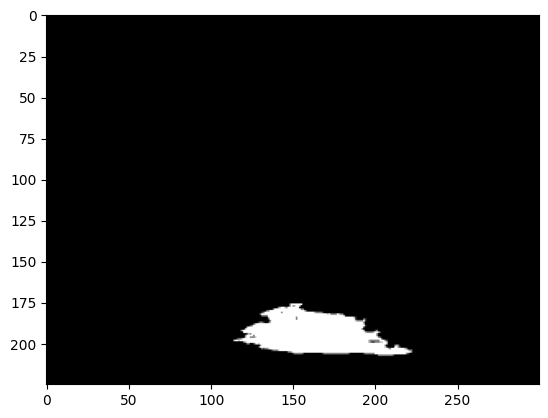

In [6]:
def new_dim(img):
    segs = np.empty((225,300,1))
    segs[:,:,0] = img
    return segs

segmentations_2 = np.array([new_dim(img) for img in segmentations])
print(np.shape(segmentations_2))

plt.imshow(segmentations_2[0],cmap='gray')
plt.show()

### Preparación de los datos para entrada en la red: redimensionamiento, reescalado, y segunda binarización de máscaras
Debido a que el algoritmo de reescalado por interpolación de `opencv` genera pixeles con valores intermedios para los bordes de la segmentación, es imperativo volver a binarizar las máscaras antes de entrenar el modelo. Esto es un artefacto fácilmente resoluble del preprocesamiento, pero no se debe pasar por alto.

In [7]:
def binarization(img):
    new_img = img.copy()
    new_img[img >= 0.5] = 1
    new_img[img < 0.5] = 0

    return new_img

segmentations_prepro = np.uint8(np.array([binarization(img) for img in segmentations_2]))

In [27]:
def segmentationDemo(img,segmentation):

    img_color = img.copy()
    
    indexes2 = np.argwhere(segmentation==1)
    
    img_color[:,:,0][indexes2[:,0],indexes2[:,1]] = 0
    img_color[:,:,1][indexes2[:,0],indexes2[:,1]] = 255
    img_color[:,:,2][indexes2[:,0],indexes2[:,1]] = 255
    
    return img_color

A continuación, se visualizan los resultados de este preprocesamiento

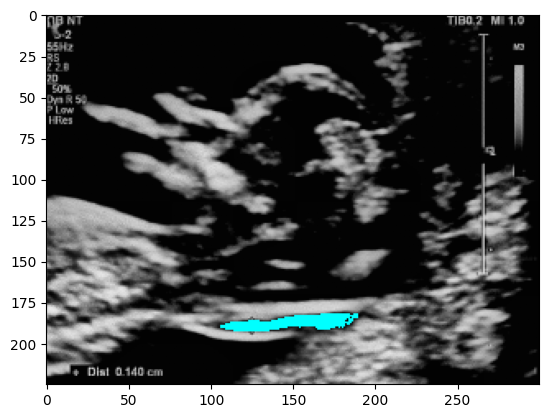

In [28]:
img_demo = segmentationDemo(images[12],segmentations_prepro[12])

plt.imshow(img_demo)
plt.show()

### Split de datos

Se utilizó un 90% de los datos para entrenamiento y un 10% para validación.

In [11]:
# Train-test split
X_train, X_val, y_train, y_val = train_test_split(images, segmentations_prepro, test_size=0.1)

# Example: Display the shape of the train and test sets
print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("y_train shape:", y_train.shape)
print("y_val shape:", y_val.shape)

X_train shape: (999, 225, 300, 3)
X_val shape: (111, 225, 300, 3)
y_train shape: (999, 225, 300, 1)
y_val shape: (111, 225, 300, 1)


## II.3. Modelo
Para llevar a cabo la tarea de segmentación semántica, con el objetivo de generar máscaras binarias representativas del área de interés, se utilizó una red neuronal U-NET, basada en bloques convolucionales y de pooling.
Utilizamos zero-padding para mantener el tamaño de la imagen entre las capas convolucionales de skip connection.

In [17]:
def encoder_block(inputs, num_filters): 
    # Convolution with 3x3 filter followed by ReLU activation
    x = Conv2D(num_filters, 3, padding='same')(inputs) 
    x = Activation('relu')(x) 

    # Convolution with 3x3 filter followed by ReLU activation
    x = Conv2D(num_filters, 3, padding='same')(x) 
    x = Activation('relu')(x) 

    # Max Pooling with 2x2 filter
    p = MaxPool2D(pool_size=(2, 2))(x) 
    return x, p

def decoder_block(inputs, skip_features, num_filters): 
    # Upsampling with 2x2 filter
    x = Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(inputs) 

    # Ensure the shapes match by cropping or padding
    if x.shape[1] != skip_features.shape[1] or x.shape[2] != skip_features.shape[2]:
        x = ZeroPadding2D(((0, skip_features.shape[1] - x.shape[1]), (0, skip_features.shape[2] - x.shape[2])))(x)

    # Concatenate skip connections
    x = Concatenate()([x, skip_features]) 

    # Convolution with 3x3 filter followed by ReLU activation
    x = Conv2D(num_filters, 3, padding='same')(x) 
    x = Activation('relu')(x) 

    # Convolution with 3x3 filter followed by ReLU activation
    x = Conv2D(num_filters, 3, padding='same')(x) 
    x = Activation('relu')(x) 
    return x

def unet_model(input_shape=(100, 100, 3), num_classes=1): 
    inputs = Input(input_shape) 
    
    # Contracting Path
    s1, p1 = encoder_block(inputs, 64) 
    s2, p2 = encoder_block(p1, 128) 
    s3, p3 = encoder_block(p2, 256) 
    s4, p4 = encoder_block(p3, 512) 
    
    # Bottleneck
    b1 = Conv2D(1024, 3, padding='same')(p4) 
    b1 = Activation('relu')(b1) 
    b1 = Conv2D(1024, 3, padding='same')(b1) 
    b1 = Activation('relu')(b1) 
    
    # Expansive Path
    d1 = decoder_block(b1, s4, 512) 
    d2 = decoder_block(d1, s3, 256) 
    d3 = decoder_block(d2, s2, 128) 
    d4 = decoder_block(d3, s1, 64) 
    
    # Output Layer
    outputs = Conv2D(num_classes, 1, activation='sigmoid' if num_classes == 1 else 'softmax')(d4) 
    
    model = Model(inputs, outputs, name='U-Net') 
    return model

In [16]:
# Define ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', 
                              factor=0.75, 
                              patience=8, 
                              min_lr=1e-6, 
                              verbose=1)

# Define EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_accuracy', 
                               patience=10, 
                               verbose=1, 
                               restore_best_weights=True)


Para entrenar en forma eficiente, se utilizaron estrategias de distribución equitativa de recursos para el entrenamiento de la red neuronal. Se utilizó la función de pérdida de entropía cruzada binaria y el optimizador Adam. Se utilizó una tasa de aprendizaje de 0.001 y se entrenó durante 20 épocas. Se utilizó un tamaño de lote de 32.

In [ ]:
learning_rate = 0.001

from tensorflow import distribute
strategy = distribute.MirroredStrategy()

with strategy.scope():
    # instantiate your model here
    learning_rate = 0.001
    optimizer = Adam(learning_rate=learning_rate)
    model =  unet_model(input_shape=(225, 300, 3), num_classes=1)

model.compile(optimizer= optimizer, loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 225, 300,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 225, 300,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 225, 300,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 225, 300,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 225, 300,  │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 150,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 112, 150,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 112, 150,  │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 112, 150,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 112, 150,  │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 56, 75,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 56, 75,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 56, 75,    │          0 │ conv2d_4[0][0]    │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 56, 75,    │    590,080 │ activation_4[0][… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 56, 75,    │          0 │ conv2d_5[0][0]    │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 28, 37,    │          0 │ activation_5[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 28, 37,    │  1,180,160 │ max_pooling2d_2[

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

## Entrenamiento del modelo

In [19]:
history = model.fit(
    x = X_train,
    y = y_train,
    validation_data = (X_val,y_val),
    batch_size = 32,
    epochs = 20,
    callbacks = [reduce_lr, early_stopping]
)

Epoch 1/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - accuracy: 0.8705 - loss: 0.5850 - val_accuracy: 0.9917 - val_loss: 0.0546 - learning_rate: 0.0010
Epoch 2/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 29s 891ms/step - accuracy: 0.9919 - loss: 0.0506 - val_accuracy: 0.9917 - val_loss: 0.0362 - learning_rate: 0.0010
Epoch 3/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 30s 946ms/step - accuracy: 0.9918 - loss: 0.0361 - val_accuracy: 0.9917 - val_loss: 0.0282 - learning_rate: 0.0010
Epoch 4/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 32s 980ms/step - accuracy: 0.9914 - loss: 0.0323 - val_accuracy: 0.9917 - val_loss: 0.0240 - learning_rate: 0.0010
Epoch 5/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 30s 932ms/step - accuracy: 0.9918 - loss: 0.0263 - val_accuracy: 0.9917 - val_loss: 0.0229 - learning_rate: 0.0010
Epoch 6/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 31s 963ms/step - accuracy: 0.9917 - loss: 0.0229 - val_accuracy: 0.9944 - val_loss: 0.0190 - learning_rate: 0.0010
Epoch 7/20
32/32 ━━━━━━━━━━━━━━━━━━━━ 31s 972ms/step - accuracy: 0.9934 - loss: 0.017

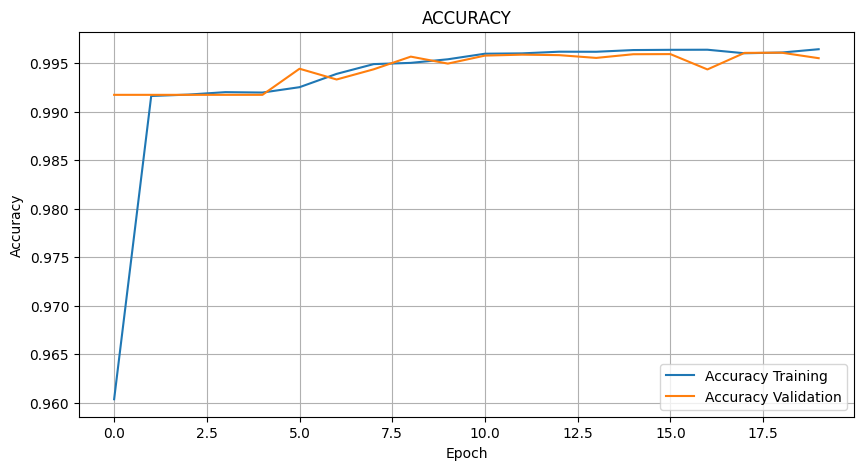

In [44]:
fig = plt.figure(figsize=(10,5))

ax = fig.add_subplot(1,1,1)
ax.plot(history.history['accuracy'],label='Accuracy Training')
ax.plot(history.history['val_accuracy'],label='Accuracy Validation')
ax.set_title('ACCURACY')
ax.legend(loc='lower right')
ax.set_ylabel('Accuracy')
ax.set_xlabel('Epoch')
ax.grid()
plt.show()

## II.4. Evaluación de resultados

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


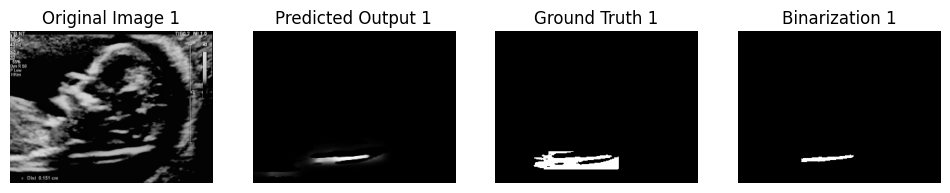

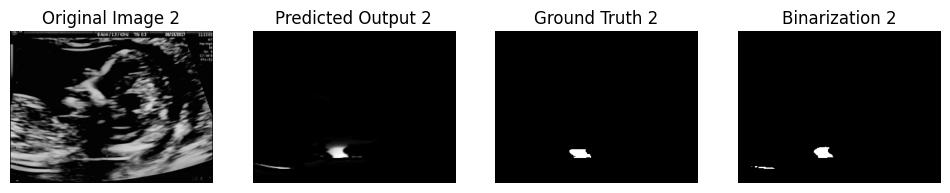

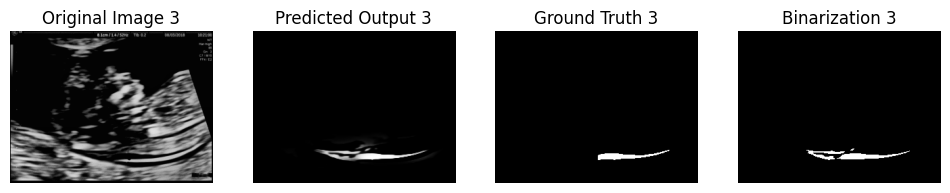

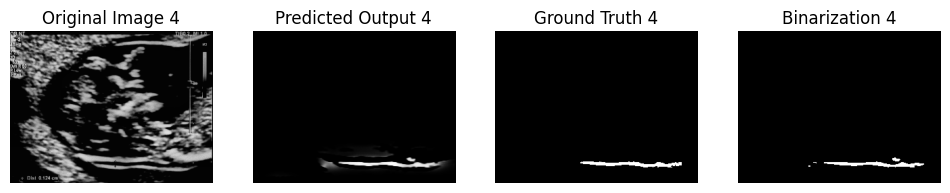

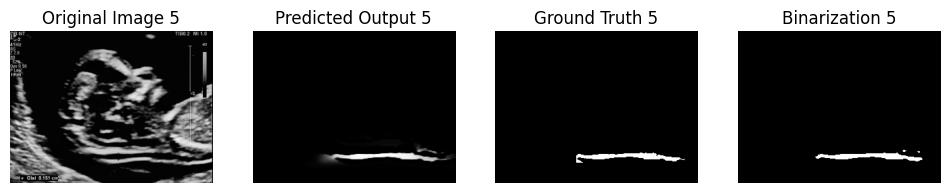

In [29]:
y_pred = model.predict(X_val[:5])  # Predict on the first 5 validation images

# Create a plot to compare original, predicted, and validation images
for i in range(5):  # Show the first 5 images
    plt.figure(figsize=(12, 4))

    # Original image (input image to the model)
    plt.subplot(1, 4, 1)
    plt.imshow(X_val[i])
    plt.title(f"Original Image {i+1}")
    plt.axis('off')

    # Predicted output (the model's output)
    plt.subplot(1, 4, 2)
    plt.imshow(y_pred[i], cmap='gray')  # Use grayscale for segmentation maps
    plt.title(f"Predicted Output {i+1}")
    plt.axis('off')

    # Validation image (ground truth mask)
    plt.subplot(1, 4, 3)
    plt.imshow(y_val[i], cmap='gray')
    plt.title(f"Ground Truth {i+1}")
    plt.axis('off')

    # Binarization of the output image
    y_bin = y_pred[i] > 0.5
    plt.subplot(1, 4, 4)
    plt.imshow(y_bin, cmap='gray')
    plt.title(f"Binarization {i+1}")
    plt.axis('off')

    # Display the plot
    plt.show()

In [34]:
def getBinarization(img_predicha,alpha=0.5):
    img = img_predicha.copy()
    img[img_predicha >= alpha] = 1
    img[img_predicha < alpha] = 0

    return img

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


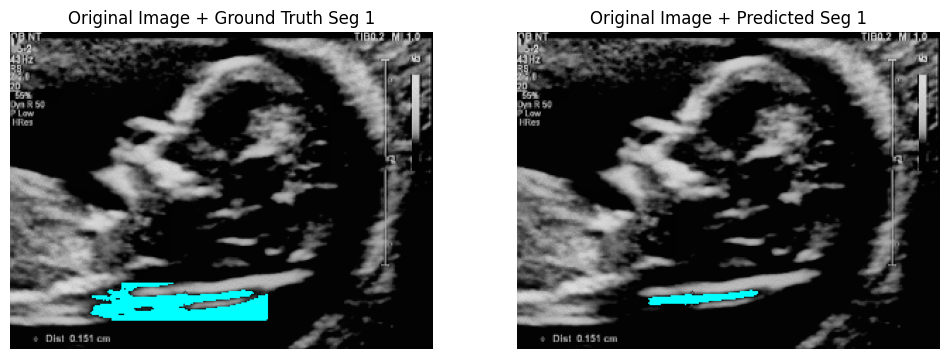

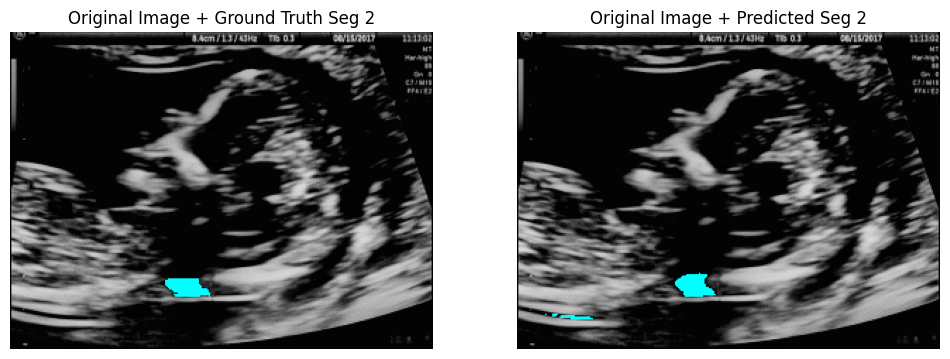

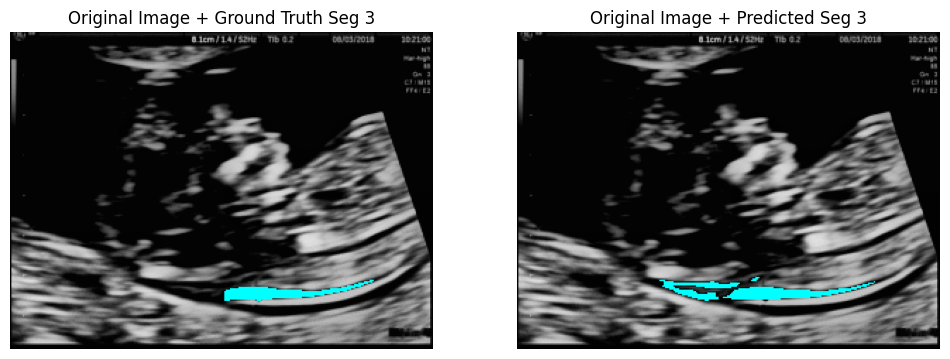

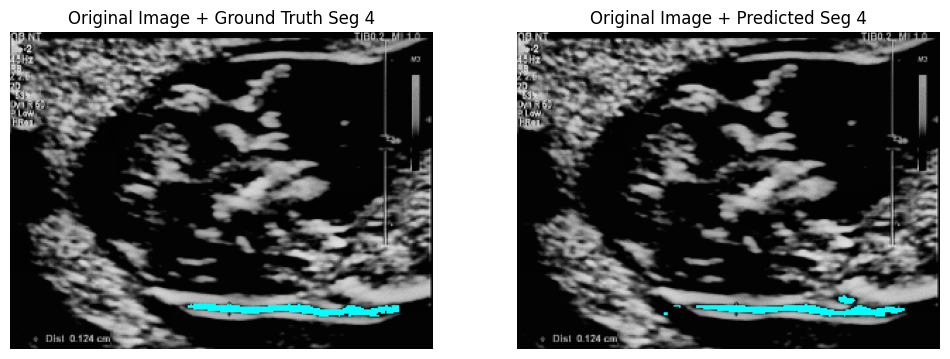

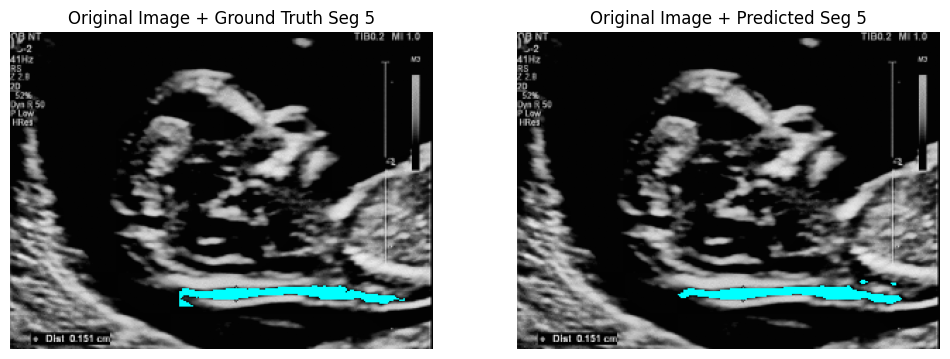

In [ ]:
y_pred = model.predict(X_val[:5])  # Predict on the first 5 validation images

# Create a plot to compare original, predicted, and validation images
for i in range(5):  # Show the first 5 images
    plt.figure(figsize=(12, 7))

    truth_seg_plus_image = segmentationDemo(X_val[i],y_val[i])

    predicted_segmentation = getBinarization(y_pred[i])

    pred_seg_plus_image = segmentationDemo(X_val[i],predicted_segmentation)
    
    plt.subplot(1, 2, 1)
    plt.imshow(truth_seg_plus_image)
    plt.title(f"Original Image + Ground Truth Seg {i+1}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(pred_seg_plus_image)
    plt.title(f"Original Image + Predicted Seg {i+1}")
    plt.axis('off')
    
    # Display the plot
    plt.show()

## II.5. Conclusiones de la segmentación
Los resultados obtenidos han sido satisfactorios, teniendo en cuenta que las segmentaciones para el entrenamiento de la U-Net fueron creadas mediante un algoritmo propio que las realizaba de manera conjunta. Es decir, no se realizó una segmentación individual, por lo que existen casos en los que la segmentación considerada como "realidad" (Ground Truth) no era perfecta. Debido a ello, es interesante cómo las predicciones del modelo en ocaciones superan a la Ground Truth, como en el caso de la imagen 1 de la figura anterior. Esto indica una comprensión semántica del área anecogénica. Sin embargo, hay ocasiones donde el modelo no es perfecto, y se cometen errores.

---

# III. DESARROLLO DE UNA INTERFAZ GRÁFICA
Para visualizar la performance del modelo en imágenes reales, se implementó una interfaz gráfica que permite seleccionar un archivo y visualizar preprocesamiento, identificación de estructuras, y segmentación de TN.

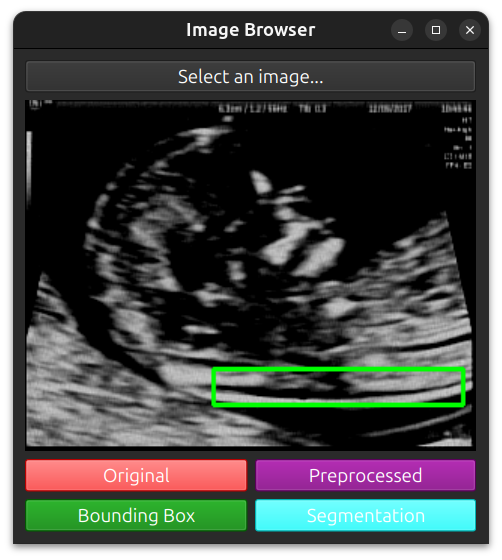
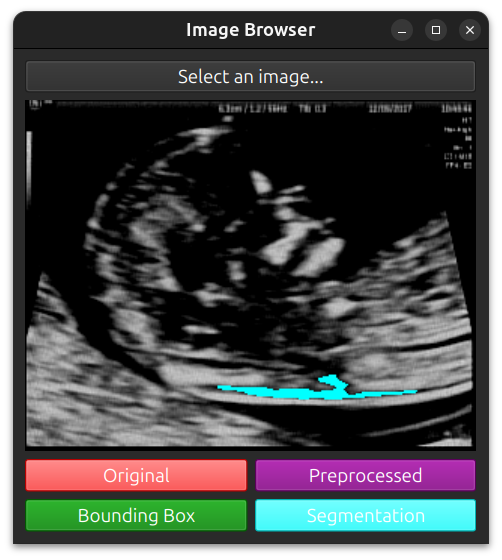

---

# IV. Conclusión
A lo largo de este trabajo, se desarrollaron herramientas automatizadas para la detección y segmentación de la translucencia nucal en imágenes de scan fetal por ultrasonido abdominal. Para ello, se preprocesaron las imágenes con técnicas avanzadas, se entrenó una red en la tarea de generar bounding boxes para identificar la estructura, se diseñó un algoritmo para encontrar el área anecogénica a partir de dichas bounding boxes, y finalmente se utilizaron estas segmentaciones para entrenar un modelo U-NET para segmentación semántica. Los resultados para la detección de la estructura fueron satisfactorios en términos de precisión, y las segmentaciones obtenidas por la red resultaron ser de alta calidad, indicando una comprensión semántica del área de interés en las imágenes de validación. A futuro, sería interesante combinar estas segmentaciones con algún algoritmo de medición automática, para poder así asistir al personal médico en su toma de decisiones. De esta manera, se podría acelerar el proceso de detección de anomalías fetales.

# Referencias
[1] C. Cui and F. Dong, “Dataset for Fetus Framework”, vol. 1, Sep. 2022, doi: 10.17632/n2rbrb9t4f.1.

[2] Y.-H. Deng, Y.-Y. Wang, and P. Chen, “Estimating Fetal Nuchal Translucency Parameters from its Ultrasound Image,” in 2008 2nd International Conference on Bioinformatics and Biomedical Engineering, May 2008, pp. 2643–2646. doi: 10.1109/ICBBE.2008.994.

[3] K. H. Nicolaides, G. Azar, D. Byrne, C. Mansur, and K. Marks, “Fetal nuchal translucency: ultrasound screening for chromosomal defects in first trimester of pregnancy,” BMJ (Clinical research ed.), vol. 304, no. 6831, pp. 867–869, Apr. 1992, doi: 10.1136/bmj.304.6831.867.

[4] D. Ramos, J. C. Santiago, M. J. Castillo, and F. Montoya, “Translucencia nucal,” Clínica e Investigación en Ginecología y Obstetricia, vol. 32, no. 2, pp. 54–60, Mar. 2005, doi: 10.1016/S0210-573X(05)73477-8.